# Vaxx Vex

Chiara Eisner, Joasia Popowicz, Matt Albasi, Sofia Jeremias, Samara Ahmed

## What's this anti-vaccination thing about?
There is a measles outbreak happening in the U.S. right now - 838 confirmed cases, according to the Centers for Disease Control and Prevention. It’s an extremely contagious disease, that can remain in the air for up to two hours someone infected has left. And it’s become a public health nightmare.

The disease starts with a rash at the head and then moves down the body. And it has significant long-term effects. It can cause brain damage, or a loss of hearing or eyesight, sometimes even death. About 1 in 4 measles patients will end up in a hospital.

In 2000, the U.S. declared measles was eliminated. But in 2014, the number of measles cases started to skyrocket, in large part due to anti-vax misinformation spread on social media. 

But groups being opposed to vaccinations in the U.S. is nothing new. The first one, the Anti-Vaccination Society of America, was founded in 1879. And there are court battles against mandated vaccinations that can be traced back to 1902. The modern anti-vax movement actually starts in 1998, after a paper published by Andrew Wakefield, a British doctor who linked the measles, mumps and rubella vaccine to autism. Though Wakefield had his medical license revoked and the paper has since been retracted, the damage was already been done. 

Over the past few years, social media platforms like YouTube and Facebook allowed anti-vax groups to organize in a grassroots way.

## Interview with Renée DiResta

Joasia and Chiara spoke with Renée DiResta on April 22, 2019

Spoke about various objects of focus of anti-vaxxers over the years. “I think at some point research into the Marisol on the preservatives becomes a topic of focus. It's a type of type of mercury.”

Revealed that lately, vaccine-focused churches have been popping up so that families can claim “religious” reasons for anti vaccination of their children.

On YouTube as a platform for spreading misinformation:

“How can we use YouTube to to get our content? I mean, most mainstream media properties won't run their stuff because they know that it's, you know, kind of a debunked conspiracy theory. And so, even though the media will occasionally do some kind of like false balance ISIS, for the most part, they won't, you know, put them on the mainstream news and give them a huge platform so YouTube was the way for them to get their popcorn.”

“They do a good job of influencer marketing.”

“It's just performative, especially in the days of social media, you can make any kind of ridiculous micro outrage micro aggressions go viral.”

Russia has been “an interesting case for a long time” even though the narratives are different from the American ones. Interestingly, the Russian Orthodox communities in the US are very often vaccine hold outs. Lots of YouTube presence, celebrity amplified.

“There's a computer science researcher who's anti vaccine named Stephanie sent us out of MIT, who did this really weird studies saying that it's glyphosate from Monsanto, that's a trace element in the vaccines. Again, just continuing with this like ingredients, ingredients, ingredients kind of thing.”

Sent us an ethnography on background.

Informed us about Washington events: “They were fundraising on GoFundMe, they raise $10,000 to run ads against the Washington bill claiming that it was going to be the start of government forced vaccination of your children.”

Spoke to us about parental motivations: “Autism is just one thing. So there are some, some parents are motivated by this notion of like, purity.”

Not always conservatives, libertarians are often anti-vaxx too: “That becomes a typical libertarian talking point is much more like a parental freedom, parental rights, particularly when the religion element does come into it again, even though no major world religion, or Canada, even the smaller ones that aren't like, you know, fake is opposed to vaccination.”

## What we found on Facebook

### Toxicity

According to Diresta a lot of information has been spread claiming that vaccines contain toxic chemicals

<img src=https://raw.githubusercontent.com/sofiajeremias/Measles/master/Toxcicity.png width=400>
<br>

### Safety

Vaccines are considered unsafe


<img src=https://raw.githubusercontent.com/sofiajeremias/Measles/master/Vaxkidshealthy.png width=400>
<br>

### Liberty

Mandatory vaccines are considered an assault of liberty


<img src=https://raw.githubusercontent.com/sofiajeremias/Measles/master/Screen%20Shot%202019-04-19%20at%2011.20.06%20AM.png width=400>
<br>

    
### Religiosity

Claims that vaccines are created using animal and human parts violate religious beliefs

<img src=https://raw.githubusercontent.com/sofiajeremias/Measles/master/Screen%20Shot%202019-04-19%20at%2010.48.46%20AM.png width=400>
<br>

There are many conspiracies alleging doctors have been killed, or are being paid out by companies like Merk. 

### Conspiracy

<img src=https://raw.githubusercontent.com/sofiajeremias/Measles/master/Screen%20Shot%202019-04-19%20at%202.28.17%20PM.png width=400>
<br>

In [ ]:
%%sh
pip install tldextract

In [ ]:
%%sh
pip install goose3

First, Sofia manually collected the links to articles being shared through a variety of closed Facebook groups.Including:
HOLISTIC LIVES MATTER (Erin Elizabeth from Health Nut News)
Vaccine Talk: A Forum for Both Pro and Anti Vaxers
A.V.P. (Anti-vax Parents)
March Against Monsanto Official Open Group
Revolution For Vaccine Choice
Vaccine Education Network : Natural Health Anti-Vaxx Community
Vaccines Facts and Information

From these groups Sofia made a list of about 30 websites that were frequently linked out to. We wanted to find out what the primary sources were for these articles so we built a webscrapper to do this:

In [ ]:
import csv
from goose3 import Goose
import tldextract

g = Goose()
links = []
with open('sites.csv', "r") as csvfile:
    rows = csv.reader(csvfile)

    for row in rows:
        url = row[0]
        print("Downloading " + url)
        article = g.extract(url=url)
        for link in article.links:
            links.append({
                'link': link,
                'source': url
            })

domains = {}
for link in links:
    domain = tldextract.extract(link['link']).domain
    if domain in domains:
        domains[domain]['count'] += 1
        domains[domain]['links'].append(link)
    else:
        domains[domain] = {
            'count': 1,
            'links': [link]
        }

with open('domains.csv','w') as output:
    writer = csv.writer(output)
    for k,v in domains.items():
        writer.writerow([k,v['count']])

with open('urls.csv','w') as output:
    writer = csv.writer(output)
    for k,v in domains.items():
        for link in v['links']:
            writer.writerow([k,link['link'],link['source']])

This created two files: one with the actual links to articles and another with just the domain names so we could quickly see which sites were being used frequently. 

In [4]:
import pandas as pd
columns = ["domain","frequency"]
domains = pd.read_csv('domains.csv',names=columns)

In [5]:
domains.head()

,domain,frequency
0,state,2
1,wired,1
2,eepurl,1
3,specificfeeds,1
4,pinterest,3


In [58]:
domains.sort_values(by=['frequency'],ascending=False)

,domain,frequency
5,NaN,260
34,nih,83
41,cdc,50
161,blogspot,29
94,nvic,20
128,naturalnews,20
20,facebook,15
147,healthytraditions,15
240,thinklovehealthy,15
32,sciencedirect,13


We see that after faulty links, the National Institutes of Health (NIH)is the most linked out to domain. After that is the CDC, then personal blogs, and then the National Vaccine Information Center (NVIC), a prominent anti-vaccination site. 

In [98]:
import pandas as pd
columns2 = ["link","url"]
urls = pd.read_csv('urls.csv',names=["site", "link", "source"])

urls

,site,link,source
0,site,link,source
1,state,https://olis.leg.state.or.us/liz/2019R1/Measur...,https://vaxxter.com/oregon-blames-downloadable...
2,state,https://www26.state.nj.us/doh-shad/indicator/c...,http://circleofmamas.com/health-news/sudden-in...
3,wired,https://www.wired.com/story/facebook-anti-vacc...,https://vaxxter.com/oregon-blames-downloadable...
4,eepurl,http://eepurl.com/cErfpD,https://vaxxter.com/oregon-blames-downloadable...
5,specificfeeds,http://www.specificfeeds.com/widgets/emailSubs...,https://vaxxter.com/oregon-blames-downloadable...
6,pinterest,https://www.pinterest.com/pin/create/button/?u...,https://vaxxter.com/oregon-blames-downloadable...
7,pinterest,http://pinterest.com/pin/create/bookmarklet/?m...,http://tenpennyimc.com/2019/04/16/i-dont-mind-...
8,pinterest,https://www.pinterest.com/naturalnews,https://www.naturalnews.com/049764_anti-vaccin...
9,NaN,#_edn1,https://thevaccinereaction.org/2019/04/vaccine...


In [61]:
#taking all the unique values and how many times they occur
urls['domain'].value_counts().shape

(938,)

Unfortunately, the low percentage of overlap meant we couldn't really determine whether or not some studies were frequently being linked out to.

So Sofia and Matt took a look at some of the studies being referenced

"Prevalence and neonatal factors associated with autism spectrum disorders in preterm infants" was one such study. It concluded that shorter periods of gestation in the womb lead to higher causes of autism. Another study was related to serotonin and its relation to IBS, not at all relevant to vaccinations. Manually looking at a sample of the articles sited a few things were prevalent:
Many were very old studies
Most were not related to vaccines but instead to either SIDS, gastrointenstinal health, or other pre-natal care problems. The articles that were about vaccines were not negative. 

One vaccine study was funded by the Koch foundation, and found that infection was more prevalent amongst un-vaccinated children in Germany. 

In the set Matt looked through it's almost ALL about Sudden Infant Death Syndrome. Whether sleeping on your stomach causes SIDS, or whether you can identify SIDS victims by lung hemorages, or whether sleeping on sheepskin causes SIDS. One interesting study showed vaccines reduced the risk of SIDS. One showed breastfeeding reduces SIDS while another showed that breastfeeding while smoking cigarettes can increase the risk of SIDS.

There were a handful of other articles that looked at the outcomes of vaccines. Some found minor effects (red skin, swollen testicles), most reccomended vaccines and only one said current studies around vaccines are deficient, but only in convey the possible side effects.

In the set Sofia looked at seven articles actually did deal with vaccination, although not a single one had any evidence that might be considered favorable to the anti-vaccination argument. The rest dealt with either gastro-intestinal issues, SIDS, or breastfeeding



## Looking at the News 

Chiara also did an analysis of news coverage over the past month.

In [ ]:
%%sh
pip install newsapi-python

In [126]:
from newsapi import NewsApiClient
newsapi = NewsApiClient(api_key='a2099994d8494516ae2731bee998da6d')
all_articles = newsapi.get_everything(q='measles',
                                     from_param='2019-04-14',
                                     to='2019-05-14',
                                     language='en',
                                     sort_by='relevancy',
                                     page=3)
print(all_articles)

{'status': 'ok', 'totalResults': 4944, 'articles': [{'source': {'id': None, 'name': 'Health24.com'}, 'author': None, 'title': 'Worldwide measles cases have nearly tripled so far in 2019, says WHO - Health24', 'description': 'Worldwide measles cases have nearly tripled so far in 2019, says WHO Health24 Measles cases up by 300% so far in 2019, says WHO Scroll.in Measles cases triple globally in 2019, says UN BBC News Measles, Science and the Anti-Vaxxers The New York Times Measles …', 'url': 'https://www.health24.com/Medical/Childhood-diseases/Measles/worldwide-measles-cases-have-nearly-tripled-so-far-in-2019-says-who-20190416', 'urlToImage': 'http://cdn.24.co.za/files/Cms/General/d/4951/9f9e060ac0324d3d843555836bd14a8f.jpg', 'publishedAt': '2019-04-16T06:02:47Z', 'content': 'The World Health Organization (WHO) said on Monday that measles cases have continued to climb in 2019, with reported cases in the first three months of 2019 nearly 300% higher versus the same period last year.\r\nMe

In [127]:
from pprint import pprint
pprint(all_articles)

{'articles': [{'author': None,
               'content': 'The World Health Organization (WHO) said on Monday '
                          'that measles cases have continued to climb in 2019, '
                          'with reported cases in the first three months of '
                          '2019 nearly 300% higher versus the same period last '
                          'year.\r\n'
                          'Measles is a highly contagious disease, and has … '
                          '[+1045 chars]',
               'description': 'Worldwide measles cases have nearly tripled so '
                              'far in 2019, says WHO Health24 Measles cases up '
                              'by 300% so far in 2019, says WHO Scroll.in '
                              'Measles cases triple globally in 2019, says UN '
                              'BBC News Measles, Science and the Anti-Vaxxers '
                              'The New York Times Measles …',
               'publishedAt': 

In [128]:
all_articles.keys

<function dict.keys>

In [129]:
all_articles.keys()

dict_keys(['status', 'totalResults', 'articles'])

In [132]:
all_articles['articles']

[{'source': {'id': None, 'name': 'Health24.com'},
  'author': None,
  'title': 'Worldwide measles cases have nearly tripled so far in 2019, says WHO - Health24',
  'description': 'Worldwide measles cases have nearly tripled so far in 2019, says WHO Health24 Measles cases up by 300% so far in 2019, says WHO Scroll.in Measles cases triple globally in 2019, says UN BBC News Measles, Science and the Anti-Vaxxers The New York Times Measles …',
  'url': 'https://www.health24.com/Medical/Childhood-diseases/Measles/worldwide-measles-cases-have-nearly-tripled-so-far-in-2019-says-who-20190416',
  'urlToImage': 'http://cdn.24.co.za/files/Cms/General/d/4951/9f9e060ac0324d3d843555836bd14a8f.jpg',
  'publishedAt': '2019-04-16T06:02:47Z',
  'content': 'The World Health Organization (WHO) said on Monday that measles cases have continued to climb in 2019, with reported cases in the first three months of 2019 nearly 300% higher versus the same period last year.\r\nMeasles is a highly contagious disease,

Our searches revealed there have been

* 1288 articles about "anti-vaccination"
* 1288 for "anti-vaccine"
* 105 about "chicken pox"
* 105 misinformation AND measles
* 359 with misinformation AND anti-vaccination

## Looking at vaccination databases

Matt took a look at publicly available data concerning children vaccinated in New York schools

On April 2, we accessed [NYC Open Data](https://opendata.cityofnewyork.us) and found the School Immunization Survey data. These data contained the information collected from a survey of immunization records for each year since 2012-2013 from all schools in the state. 

They were broken down by percent immunized for diseases like polio and measles, and listed the percent of students who claimed religious or medical exemptions. It also contained information about the school district, like zip code, location and county. About 33,000 schools in total were in the data set. All counties except for those in NYC were removed from our data for analysis.

Public schools measle vaccine rates were never below 93%, the amount estimated to maintain "herd immunity." 

Private school did not fair as well. Of the more than 2,500 surveys in this data, 259 didn't meet the "herd immunity" standard. Some of them, like [Redeemer Lutheran School](http://rlgschool.org) were below the immunity threshold every single year on record.

[Rudolf Steiner School](https://steiner.edu) stood out in the data for a different reason. It's homepage touts that it's celebrating 90 years in buisness and claims to be "[a] tradition that ignites modern minds." [It costs](https://www.privateschoolreview.com/rudolf-steiner-school-profile) just under $50,000 per year in tuition, but only 55 percent of its students were fully immunized. For measles, Rudolf Steiner was near the lowest threshold for herd immunity.

Another school that stood apart was [Sister Clara Mohammed Elementary School](http://nycmschools.com) sitting just on the other side of Morningside Park. This is the only school to claim 100 percent religious exemption.

## Twitter 

Joasia looked at the roundtable of reasonable discourse that is Twitter 

When I first was working on this notebook there were 626 measles cases. 

As of May 10, 2019, 839 individual cases of measles have been confirmed in 23 states. 

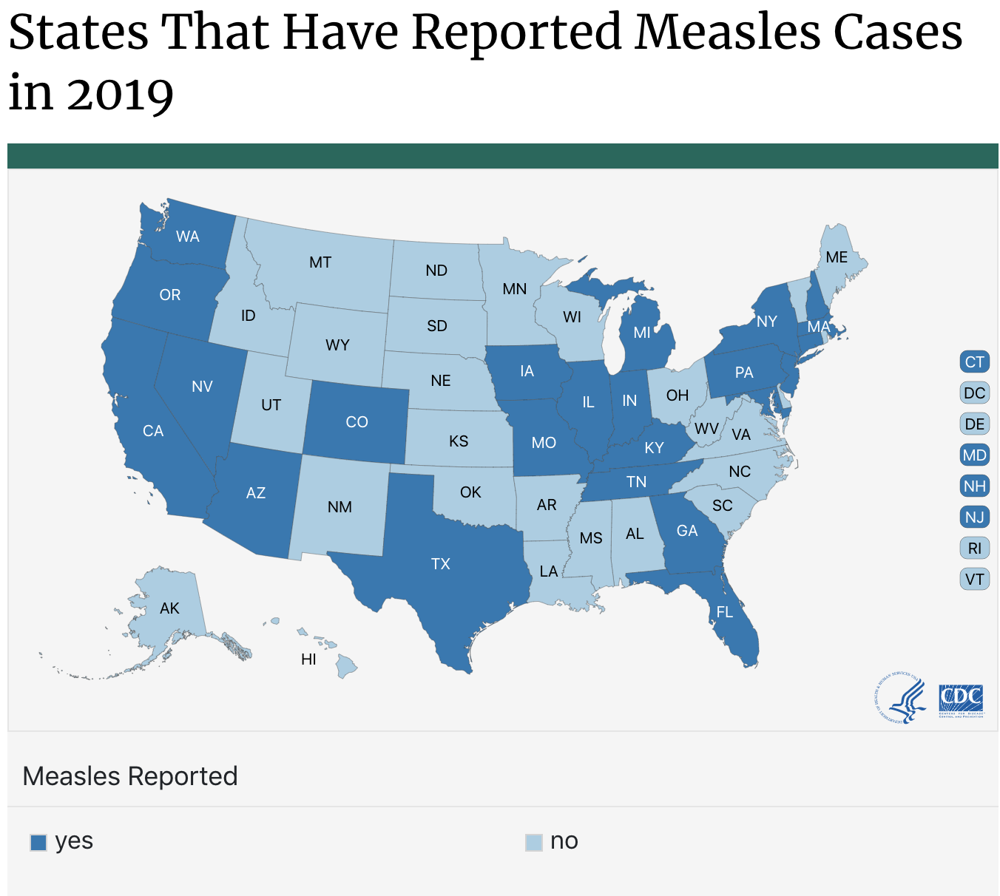

This is the greatest number of cases reported in the U.S. since 1994 and since measles was declared eliminated in 2000.

The states that have reported cases to CDC are Arizona, California, Colorado, Connecticut, Florida, Georgia, Illinois, Indiana, Iowa, Kentucky, Maryland, Massachusetts, Michigan, Missouri, Nevada, New Hampshire, New Jersey, New York, Oregon, Texas, Tennessee, and Washington."

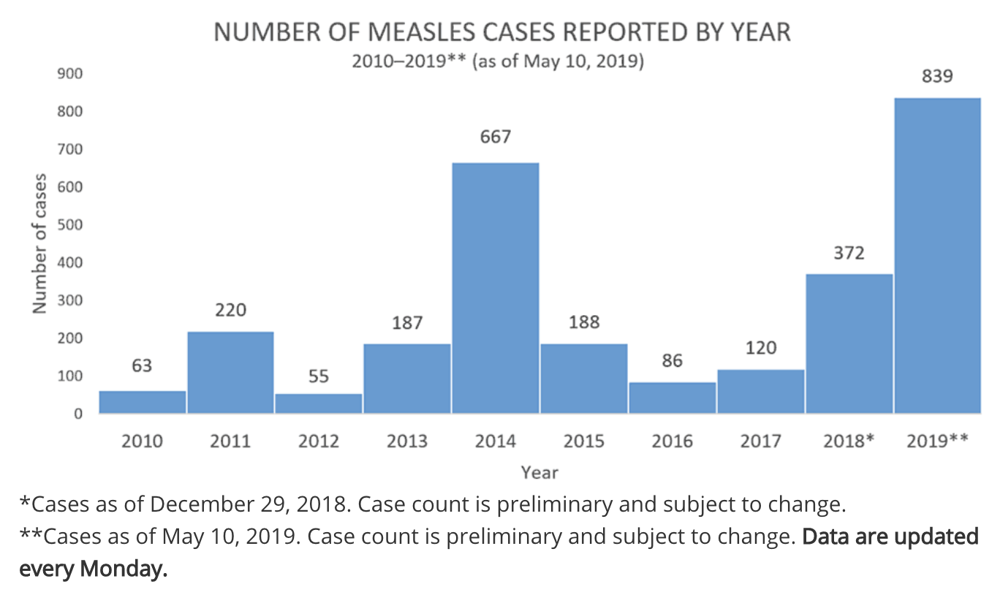

There is an interesting international component as cases of measles have increased 300 percent on last year https://www.washingtonpost.com/world/2019/04/16/world-health-organization-says-measles-cases-up-percent/?utm_term=.f5b7cfbc0043 The current outbreak in the US can be traced to Ukraine, Israel and the Philippines. Poor infrastructure and healthcare systems are factors in certain regions, but **vaccination hesitancy** leaves other populations vulnerable. 

## Researchers have found foreign agents amplifying anti-vaxx sentiments.

Broniatowski et al (2018)
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6137759/ Weaponized Health Communication: Twitter Bots and Russian Trolls Amplify the Vaccine Debate

"Conclusions. Whereas bots that spread malware and unsolicited content disseminated antivaccine messages, Russian trolls promoted discord. Accounts masquerading as legitimate users create false equivalency, eroding public consensus on vaccination.

Public Health Implications. Directly confronting vaccine skeptics enables bots to legitimize the vaccine debate. More research is needed to determine how best to combat bot-driven content."

## Let's have a look...

Trumps tweets
https://docs.google.com/document/d/1-gcCHL4wMc89HZgt3nxhWhmDW-8KNBN8-GOAZbVG5PE/edit?usp=sharing

# Our dear leader
Trump has historically tweeted disceminating false information linking vaccines to autism. 

In [1]:
%%HTML
<blockquote class="twitter-tweet" data-lang="en"><p lang="en" dir="ltr">Healthy young child goes to doctor, gets pumped with massive shot of many vaccines, doesn't feel good and changes - AUTISM. Many such cases!</p>&mdash; Donald J. Trump (@realDonaldTrump) <a href="https://twitter.com/realDonaldTrump/status/449525268529815552ref_src=twsrc%5Etfw">March 28, 2014</a></blockquote>
<script async src="https://platform.twitter.com/widgets.js" charset="utf-8"></script>


Although to be fair...

https://www.reuters.com/article/us-usa-measles-trump/trump-tells-americans-go-get-your-measles-vaccination-idUSKCN1S21GE

In March, Trump told Americans to get vaccinations. 

## Key findings

## Trending hashtags #Vexit #Vaxxed

But who are the main players? 

In [2]:
# before we can make Twitter API calls, we need to initialize a few things...
from tweepy import OAuthHandler, API, Cursor
import random

CONSUMER_KEY = "1NzUgtxDn0r5VWCKZKBeIL3Rh"
CONSUMER_SECRET = "vvpADzSEqEA3BiH6Crmu6gAZOPuQSoLoUK9sjcKKM0Jb1iDvHE"

ACCESS_TOKEN = "1099367063469080577-wf8Tv92fo5MxkF5bx5IamEDt0Jke8H"
ACCESS_TOKEN_SECRET = "RIvh9vQUDRZef7NtK59Cc7oF5fkqvpF7KYhZoc6ZpAhH4"

auth = OAuthHandler(CONSUMER_KEY, CONSUMER_SECRET)
auth.set_access_token(ACCESS_TOKEN, ACCESS_TOKEN_SECRET)

# create an object we will use to communicate with the Twitter API
api = API(auth,wait_on_rate_limit=True,wait_on_rate_limit_notify=True)

MashKey = "NAeSF7TTbymshxelRHhCXqlQVfc0p1zgYQojsnVombDJddPvas"

In [ ]:
#vexit

In [3]:
searches = [status for status in Cursor(api.search,q='vexit', result_type='recent').items(1000)]

In [4]:
from pprint import pprint
pprint(searches[0]._json)

{'contributors': None,
 'coordinates': None,
 'created_at': 'Mon Apr 22 18:50:33 +0000 2019',
 'entities': {'hashtags': [{'indices': [0, 6], 'text': 'vexit'},
                           {'indices': [7, 11], 'text': 'usa'},
                           {'indices': [12, 23], 'text': 'california'}],
              'media': [{'display_url': 'pic.twitter.com/ukV58yZ3Q2',
                         'expanded_url': 'https://twitter.com/healthyown/status/1120399510574903297/video/1',
                         'id': 1120399401833369601,
                         'id_str': '1120399401833369601',
                         'indices': [24, 47],
                         'media_url': 'http://pbs.twimg.com/ext_tw_video_thumb/1120399401833369601/pu/img/DTonXDww7JFjUVGa.jpg',
                         'media_url_https': 'https://pbs.twimg.com/ext_tw_video_thumb/1120399401833369601/pu/img/DTonXDww7JFjUVGa.jpg',
                         'sizes': {'large': {'h': 1078,
                                             'r

## Create a network graph to understand tweet originators and amplifiers 

In [5]:
# Make a dictionary of lists, where each list is a column in the table

froms = []
tos = []
edges = []

# iterate through the 1000 tweet objects we collected
for tweetobj in searches:

    # use the built-in python form of the data (dictionaries and lists)
    tweet = tweetobj._json
    
    # pull the screen name of the "from"
    screen_name = tweet["user"]["screen_name"]
    
    # pull the "to's" that are mentions (assuming accounts are mentioned)
    if "user_mentions" in tweet["entities"]:
        
        for mention in tweet["entities"]["user_mentions"]:
            
            # pull out the name of the "to"
            mention_name = mention["screen_name"]
            
            # and add to the lists
            edges.append("mention")
            tos.append(mention_name)
            froms.append(screen_name)

In [6]:
from pandas import DataFrame

df = DataFrame({"FromType":"Twitter","FromName":froms,"Edge":edges,"ToType":"Twitter","ToName":tos})
df.head(10)

,FromType,FromName,Edge,ToType,ToName
0,Twitter,aspiesmom,mention,Twitter,45HammerTime
1,Twitter,aspiesmom,mention,Twitter,45HammerTime
2,Twitter,aspiesmom,mention,Twitter,45HammerTime
3,Twitter,HolyBasil7,mention,Twitter,healthyown
4,Twitter,Freedom14021426,mention,Twitter,healthyown
5,Twitter,greenheartsinfo,mention,Twitter,healthyown
6,Twitter,greenheartsinfo,mention,Twitter,healthyown
7,Twitter,Bensamsona1,mention,Twitter,healthyown
8,Twitter,KarenLKeeley1,mention,Twitter,healthyown
9,Twitter,KarenLKeeley1,mention,Twitter,45HammerTime


In [7]:
df["ToName"].value_counts().head(10)

healthyown         121
45HammerTime        14
JoyRobe47035669      5
ESHforOregon         5
PharmaHealthAT       5
duckwilde            5
ORSenDemocrats       5
OregonGovBrown       5
SenSaraGelser        5
TannersDad           4
Name: ToName, dtype: int64

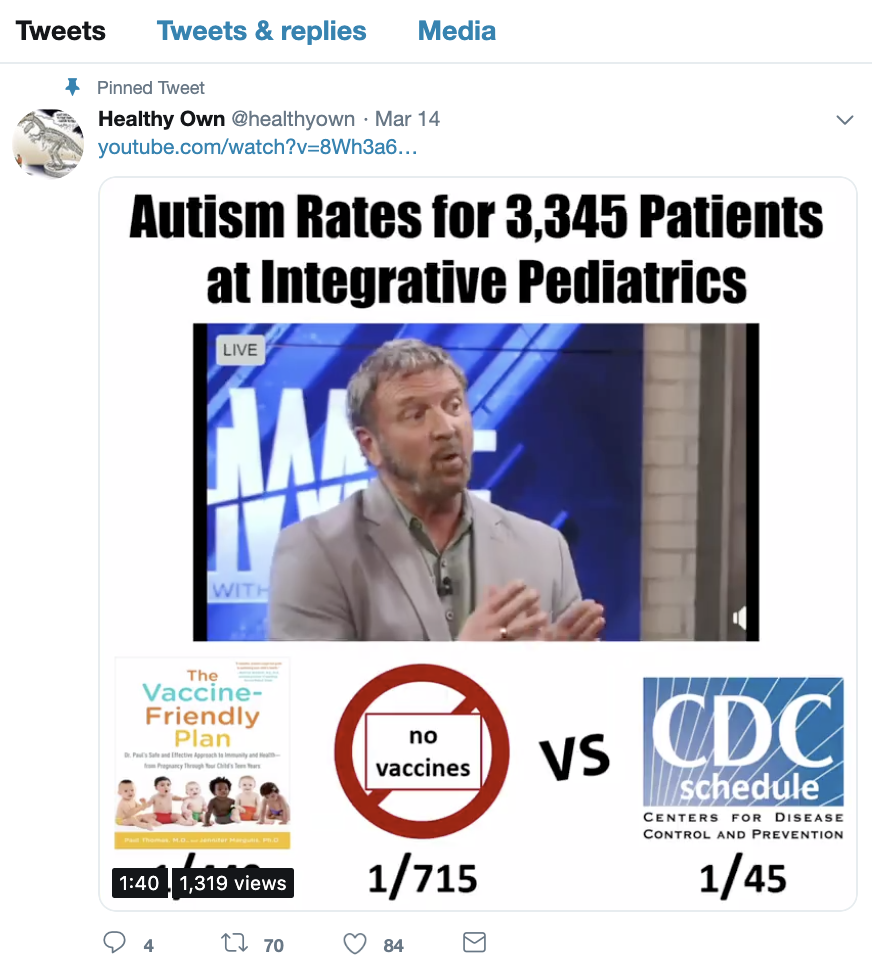

In [8]:
from botometer import Botometer

meter = Botometer(wait_on_ratelimit=True,
                  mashape_key=MashKey,
                  consumer_key = CONSUMER_KEY,
                  consumer_secret = CONSUMER_SECRET,
                  access_token = ACCESS_TOKEN,
                  access_token_secret = ACCESS_TOKEN_SECRET)

In [9]:
result = meter.check_account("healthyown")
print(result["display_scores"]["english"])

3.0


In [10]:
#Strength of relationship 

df = df.groupby(["FromType","FromName","Edge","ToType","ToName"]).size().reset_index().rename(columns={0:'Weight'})

In [11]:
df.head(20)

,FromType,FromName,Edge,ToType,ToName,Weight
0,Twitter,45HammerTime,mention,Twitter,212_815,1
1,Twitter,45HammerTime,mention,Twitter,AW95NJ,1
2,Twitter,45HammerTime,mention,Twitter,Aug1405,1
3,Twitter,45HammerTime,mention,Twitter,Chena_Punim,1
4,Twitter,45HammerTime,mention,Twitter,DLindsey2,1
5,Twitter,45HammerTime,mention,Twitter,DMeinns,1
6,Twitter,45HammerTime,mention,Twitter,DoingRight1,2
7,Twitter,45HammerTime,mention,Twitter,FairyQ15,1
8,Twitter,45HammerTime,mention,Twitter,GeanineC,1
9,Twitter,45HammerTime,mention,Twitter,HeartoftheLion7,1


In [21]:
#Visualize

froms = []
tos = []
edges = []

# iterate through the 1000 tweets we collected
for tweetobj in searches:

    # use the built-in python form of the data (dictionaries and lists)
    tweet = tweetobj._json
    
    # pull the screen name of the "from"
    screen_name = tweet["user"]["screen_name"]
    link = []

    # the "link" list will hold the names of people we have included in our 
    # graph already (so if someone retweets and mentions someone, we only get one of these)
    
    # pull the "to's" that are retweets
    if "retweeted_status" in tweet:        
        retweet_name = tweet["retweeted_status"]["user"]["screen_name"]
        link.append(retweet_name)
        
        edges.append("retweet")
        tos.append(retweet_name)
        froms.append(screen_name)
    
    # pull the "to's" that are replies
    if tweet["in_reply_to_screen_name"]:
        reply_name = tweet["in_reply_to_screen_name"]
        
        if not reply_name in link:
             
             edges.append("reply")
             tos.append(reply_name)
             froms.append(screen_name)
            
    # pull the "to's" that are mentions
    if "user_mentions" in tweet["entities"]:
        
        for mention in tweet["entities"]["user_mentions"]:
            mention_name = mention["screen_name"]
            
            if not mention_name in link:
                link.append(mention_name)
                
                edges.append("mention")
                tos.append(mention_name)
                froms.append(screen_name)

# make a data frame
df = DataFrame({"FromType":"Twitter","FromName":froms,"Edge":edges,"ToType":"Twitter","ToName":tos})

# remove and count duplicate rows
df = df.groupby(["FromType","FromName","Edge","ToType","ToName"]).size().reset_index().rename(columns={0:'Weight'})

# output to a CSV
df.to_csv("vaccine.csv",index=False)

## https://graphcommons.com/graphs/47c0852f-6096-4b6f-9f17-101375cf610b

## Create a list of malicious accounts, similar to that given to the house intelligence committee. 


Why is it important? 

Ciming back to study by Broniatowski
"Public Health Implications. Directly confronting vaccine skeptics enables bots to legitimize the vaccine debate. More research is needed to determine how best to combat bot-driven content." But not just limited to bots, disinformation more generally. 

## Similar to the list of bots given to https://intelligence.house.gov/uploadedfiles/exhibit_b.pdf

In [13]:
# Other possible bots in the network

print(froms)

#df = df.groupby(["FromType","FromName","Edge","ToType","ToName"]).size().reset_index().rename(columns={0:'Weight'})

['aspiesmom', 'aspiesmom', 'aspiesmom', 'HolyBasil7', 'Freedom14021426', 'greenheartsinfo', 'greenheartsinfo', 'Bensamsona1', 'KarenLKeeley1', 'KarenLKeeley1', 'KarenLKeeley1', 'myleerichards', '45HammerTime', '45HammerTime', 'andrewmorrisuk', 'andrewmorrisuk', '45HammerTime', '45HammerTime', 'KarenLKeeley1', 'tabbyday', 'zuidhartoptwitt', 'Royalbcoconut', 'Stutzy6', 'LIVE_CRUCIFIED', 'Bensamsona1', 'vmblog', 'Suzanq1', 'spafers', 'MFCDifference', 'susan_welch7', 'MarkVaccines', 'PennyLiddle', 'UAfoxtrot', 'UAfoxtrot', 'UAfoxtrot', 'Hulkcolossus', 'ViraBurnayeva', 'AdiMano2', 'semonaco', 'Rectitude20', 'KSColeman', 'Juanita87722370', 'Nukem37', 'GenerationVax', 'Juanita87722370', 'DanaElizabeth69', 'StayStrongNY', 'vaxxfight', 'JAutumnEdwards', '45HammerTime', 'PharmaHealthAT', 'PharmaHealthAT', 'PharmaHealthAT', 'PharmaHealthAT', 'PharmaHealthAT', 'PharmaHealthAT', 'KarenLKeeley1', 'KarenLKeeley1', 'KarenLKeeley1', 'KarenLKeeley1', 'KarenLKeeley1', 'KarenLKeeley1', 'Freedom14021426', 

In [14]:
len(froms)

260

In [16]:
set_froms = set(froms)

In [18]:
len(set_froms)

101

In [19]:
twitter_users = []

for user in set_froms:
    print(user)
    result = meter.check_account(user)
    print(result["display_scores"]["english"])
    twitter_users.append(result)

spafers
4.5
StayStrongNY
2.5
greenheartsinfo
0.7
xileenie
1.1
DanaElizabeth69
1.3
JMONEILL1975
0.8
Bensamsona1
0.6
PennyLiddle
0.8
MinnReb
0.8
theMAGAbot
3.6
SusanFolk4
1.1
nanisbabies2000
0.2
Suzanq1
0.5
Stutzy6
1.2
PurgeGlobalists
0.4
angycocco
0.5
svagdis
0.8
Bulwark_77
1.7
UAfoxtrot
0.3
indigosky9
0.7
Juliann990
0.7
curvar1
0.3
Gumdrop1956
0.7
SharonLThunder
0.2
gibsongirl247
0.7
Nukem37
0.4
zuidhartoptwitt
0.5
Royalbcoconut
0.3
KirstinFlores11
2.7
KarenLKeeley1
0.8
BonnieP04147694
0.6
pathfinder1898
0.5
FloBo2018
0.9
RichardILevine
0.5
desk_in_corner
0.4
HolyBasil7
3.8
CherryAnnWilli4
0.4
pepsiholic1990
0.5
vaxxfight
0.4
TeamMorrow1
0.2
MFCDifference
0.4
sig_3872
0.2
SNCCLA
1.7
lonibomba
1.0
LaLaRueFrench75
1.2
flet_jess
0.9
Theadragonfly
0.5
_zerofox_
0.6
NicoleW33838832
0.6
Juanita87722370
1.9
ljrosano
1.3
susan_welch7
0.2
CplBart
2.1
chassels
0.9
MasterDuke1
0.4
Patrici41859934
1.5
DrKND
0.2
RichSqueezy
0.5
aspiesmom
0.7
BoggyLuuuu
0.6
PaulTheMartian
0.2
andrewmorrisuk
1.8
JAut

In [1]:
# before we can make Twitter API calls, we need to initialize a few things...
from tweepy import OAuthHandler, API, Cursor
import random

CONSUMER_KEY = "1NzUgtxDn0r5VWCKZKBeIL3Rh"
CONSUMER_SECRET = "vvpADzSEqEA3BiH6Crmu6gAZOPuQSoLoUK9sjcKKM0Jb1iDvHE"

ACCESS_TOKEN = "1099367063469080577-wf8Tv92fo5MxkF5bx5IamEDt0Jke8H"
ACCESS_TOKEN_SECRET = "RIvh9vQUDRZef7NtK59Cc7oF5fkqvpF7KYhZoc6ZpAhH4"

auth = OAuthHandler(CONSUMER_KEY, CONSUMER_SECRET)
auth.set_access_token(ACCESS_TOKEN, ACCESS_TOKEN_SECRET)

# create an object we will use to communicate with the Twitter API
api = API(auth,wait_on_rate_limit=True,wait_on_rate_limit_notify=True)

MashKey = "NAeSF7TTbymshxelRHhCXqlQVfc0p1zgYQojsnVombDJddPvas"

In [2]:
#vaxxed

In [3]:
vaxxed_searches = [status for status in Cursor(api.search,q='vaxxed', result_type='recent').items(1000)]

In [5]:
from pprint import pprint
pprint(vaxxed_searches[0]._json)

{'contributors': None,
 'coordinates': None,
 'created_at': 'Mon May 06 15:40:27 +0000 2019',
 'entities': {'hashtags': [],
              'symbols': [],
              'urls': [],
              'user_mentions': [{'id': 1041834953204486146,
                                 'id_str': '1041834953204486146',
                                 'indices': [3, 17],
                                 'name': 'NIKOLA TESLA 2.0',
                                 'screen_name': 'T__E__S__L__A'},
                                {'id': 701469868856635393,
                                 'id_str': '701469868856635393',
                                 'indices': [19, 35],
                                 'name': 'Take That, Medicine!',
                                 'screen_name': 'Takethatdoctors'},
                                {'id': 721219274514239488,
                                 'id_str': '721219274514239488',
                                 'indices': [36, 47],
                          

In [7]:
# We are going to make a dictionary of lists, where each list is a column in the table

froms = []
tos = []
edges = []

# iterate through the 1000 tweet objects we collected
for tweetobj in vaxxed_searches:

    # use the built-in python form of the data (dictionaries and lists)
    tweet = tweetobj._json
    
    # pull the screen name of the "from"
    screen_name = tweet["user"]["screen_name"]
    
    # pull the "to's" that are mentions (assuming accounts are mentioned)
    if "user_mentions" in tweet["entities"]:
        
        for mention in tweet["entities"]["user_mentions"]:
            
            # pull out the name of the "to"
            mention_name = mention["screen_name"]
            
            # and add to the lists
            edges.append("mention")
            tos.append(mention_name)
            froms.append(screen_name)

In [21]:
from pandas import DataFrame

df = DataFrame({"FromType":"Twitter","FromName":froms,"Edge":edges,"ToType":"Twitter","ToName":tos})
df.head(100)

,FromType,FromName,Edge,ToType,ToName
0,Twitter,Takethatdoctors,retweet,Twitter,T__E__S__L__A
1,Twitter,Takethatdoctors,mention,Twitter,Takethatdoctors
2,Twitter,Takethatdoctors,mention,Twitter,TheRoadCop
3,Twitter,T__E__S__L__A,reply,Twitter,Takethatdoctors
4,Twitter,T__E__S__L__A,mention,Twitter,Takethatdoctors
5,Twitter,T__E__S__L__A,mention,Twitter,TheRoadCop
6,Twitter,sammyjotweets,retweet,Twitter,ViraBurnayeva
7,Twitter,FLAutismMom,reply,Twitter,sallie_bryant75
8,Twitter,FLAutismMom,mention,Twitter,sallie_bryant75
9,Twitter,FLAutismMom,mention,Twitter,Mileystan3


In [9]:
df["ToName"].value_counts().head(10)

SGTreport          164
ViraBurnayeva       58
aIecrl              56
SNCCLA              49
realDonaldTrump     40
NYCMayor            33
mcfunny             23
doritmi             20
StopVaxxedLies      20
Fiona__Mills        19
Name: ToName, dtype: int64

In [10]:
from botometer import Botometer

meter = Botometer(wait_on_ratelimit=True,
                  mashape_key=MashKey,
                  consumer_key = CONSUMER_KEY,
                  consumer_secret = CONSUMER_SECRET,
                  access_token = ACCESS_TOKEN,
                  access_token_secret = ACCESS_TOKEN_SECRET)

In [11]:
result = meter.check_account("SGTreport")
print(result["display_scores"]["english"])

0.3


In [12]:
#Strength of relationship 

df = df.groupby(["FromType","FromName","Edge","ToType","ToName"]).size().reset_index().rename(columns={0:'Weight'})

In [11]:
df.head(20)

,FromType,FromName,Edge,ToType,ToName,Weight
0,Twitter,45HammerTime,mention,Twitter,212_815,1
1,Twitter,45HammerTime,mention,Twitter,AW95NJ,1
2,Twitter,45HammerTime,mention,Twitter,Aug1405,1
3,Twitter,45HammerTime,mention,Twitter,Chena_Punim,1
4,Twitter,45HammerTime,mention,Twitter,DLindsey2,1
5,Twitter,45HammerTime,mention,Twitter,DMeinns,1
6,Twitter,45HammerTime,mention,Twitter,DoingRight1,2
7,Twitter,45HammerTime,mention,Twitter,FairyQ15,1
8,Twitter,45HammerTime,mention,Twitter,GeanineC,1
9,Twitter,45HammerTime,mention,Twitter,HeartoftheLion7,1


In [15]:
#Visualize

froms = []
tos = []
edges = []

# iterate through the 1000 tweets we collected
for tweetobj in vaxxed_searches:

    # use the built-in python form of the data (dictionaries and lists)
    tweet = tweetobj._json
    
    # pull the screen name of the "from"
    screen_name = tweet["user"]["screen_name"]
    link = []

    # the "link" list will hold the names of people we have included in our 
    # graph already (so if someone retweets and mentions someone, we only get one of these)
    
    # pull the "to's" that are retweets
    if "retweeted_status" in tweet:        
        retweet_name = tweet["retweeted_status"]["user"]["screen_name"]
        link.append(retweet_name)
        
        edges.append("retweet")
        tos.append(retweet_name)
        froms.append(screen_name)
    
    # pull the "to's" that are replies
    if tweet["in_reply_to_screen_name"]:
        reply_name = tweet["in_reply_to_screen_name"]
        
        if not reply_name in link:
             
             edges.append("reply")
             tos.append(reply_name)
             froms.append(screen_name)
            
    # pull the "to's" that are mentions
    if "user_mentions" in tweet["entities"]:
        
        for mention in tweet["entities"]["user_mentions"]:
            mention_name = mention["screen_name"]
            
            if not mention_name in link:
                link.append(mention_name)
                
                edges.append("mention")
                tos.append(mention_name)
                froms.append(screen_name)

# make a data frame
df = DataFrame({"FromType":"Twitter","FromName":froms,"Edge":edges,"ToType":"Twitter","ToName":tos})

# remove and count duplicate rows
df = df.groupby(["FromType","FromName","Edge","ToType","ToName"]).size().reset_index().rename(columns={0:'Weight'})

# output to a CSV
df.to_csv("vaxxed_vaccine.csv",index=False)

## https://graphcommons.com/graphs/2973305d-7976-411f-8641-2a64d00a25ce?auto=true&show=info

In [16]:
# Other possible bots in the network

print(froms)

#df = df.groupby(["FromType","FromName","Edge","ToType","ToName"]).size().reset_index().rename(columns={0:'Weight'})

['Takethatdoctors', 'Takethatdoctors', 'Takethatdoctors', 'T__E__S__L__A', 'T__E__S__L__A', 'T__E__S__L__A', 'sammyjotweets', 'FLAutismMom', 'FLAutismMom', 'FLAutismMom', 'Brenda63659626', 'WarriorWifeMom', 'sonofroma', 'sonofroma', 'T__E__S__L__A', 'T__E__S__L__A', 'T__E__S__L__A', 'CollChris', 'CollChris', 'Valafl', 'DunbarLawMS', 'A_Silent_Child', 'A_Silent_Child', 'A_Silent_Child', 'MeddlinMegs', 'MeddlinMegs', 'MeddlinMegs', 'MeddlinMegs', 'MeddlinMegs', 'MeddlinMegs', 'MeddlinMegs', 'MeddlinMegs', 'MeddlinMegs', 'fionn', 'fionn', 'ColoradoGal15', 'patriot7842', 'cafe_health', 'topsecretinfo17', 'MoneCharl', 'CelineMarin3', 'HollandHeather', 'EloaDoner', 'djpublius', 'QuintRuden', 'QuintRuden', 'DrKND', 'SJerzeegrl', 'EireBuachaill', 'patrici61580698', 'GenerationVax', 'T__E__S__L__A', 'T__E__S__L__A', 'T__E__S__L__A', 'T__E__S__L__A', 'T__E__S__L__A', 'T__E__S__L__A', 'T__E__S__L__A', 'T__E__S__L__A', 'MysticWanderer3', '45HammerTime', 'BillJohnson0102', 'T__E__S__L__A', 'T__E__S

In [17]:
len(froms)

1726

In [18]:
set_froms = set(froms)

In [19]:
len(set_froms)

523

In [20]:
vaxxed_twitter_users = []

for user in set_froms:
    print(user)
    result = meter.check_account(user)
    print(result["display_scores"]["english"])
    vaxxed_twitter_users.append(result)

AJBeggz2tweet
0.2
sonicsouffles
0.3
lizlovesglitter
0.4
CharlesLazelle
0.3
telosa3
0.4
jean_laplaine
2.2
homerjarvis11
1.5
SuzyCryptoKeto
0.5
eileen970
2.6
goodlittlebits
0.5
brian_pahalek
0.8
ZMimi8
1.0
CoffeeteaP
1.4
shane_bitcoin
0.5
Sanssexual
0.3
araffbrab
0.6
don_diesel520
0.2
ClaytonRobins
1.4
SharonLThunder
0.3
RosieMac84
3.1
jojo2727
0.6
jabarisafari
0.5
meldouglas98
0.3
realityisagoodt
0.3
hthrun
2.7
goldste57881662
0.6
edtraveler
0.5
StormcrowNews
0.2
Lthe1Paulmichae
0.6
Crankygranny3
1.2
asiamoonbloom
0.4
dei_cosart
0.5
midwhiteflava
0.3
ColleenHuberNMD
0.4
PNWTrumpFan
0.5
RickAfonso3
1.5
Duck_hk
1.3
kndagreat
0.2
ABernadette
1.4
VegaWellness
0.4
StephanieBrys11
1.3
bev_60
0.2
Jodijoh32651826
1.0
Juanita87722370
1.5
PileOfGoop
1.2
Bailey_Gomez
0.3
TamiFreedman
1.7
jm71witmr
0.6
mrsjcornwell
0.2
jp07r6
0.2
REALITYofJNJ
1.4
ukfathers
1.0
bruceal06061355


HTTPError: 502 Server Error: Proxy Error for url: https://osome-botometer.p.mashape.com/2/check_account

# MAGA 

Evidence of co-opting hashtags as a strategy

In [9]:
%%HTML
<blockquote class="twitter-tweet" data-lang="en"><p lang="en" dir="ltr">PLEASE ADD AND FOLLOW
🇺🇸🇺🇸 @maga_teens 🇺🇸🇺🇸
WE NEED YOUNG PEOPLE TO HELP RE-ELECT @realDonaldTrump
@hoppinmama5
@krunalley
@NJ_2_FL
@NahBabyNah
@gator4kb18
@Patti_Sc60
@KAG1776MAGA
@LisaLynn_18
@Rixon_tk
@KevinMFerrara
@kevin_ponton
@Burn1tD0wn
@DDW8569
@NewDayForNJ
@Aug1405</p>&mdash;  🇺🇲 🇺🇲 ❌Deplorable ❌  🇺🇲 🇺🇸 (@Libphobic) <a href="https://twitter.com/Libphobic/status/1128298825901268993">May 14, 2019</a></blockquote>
<script async src="https://platform.twitter.com/widgets.js" charset="utf-8"></script>


# MAGA 

Make Autism Go Away

Be...The Billboard

## https://twitter.com/45HammerTime

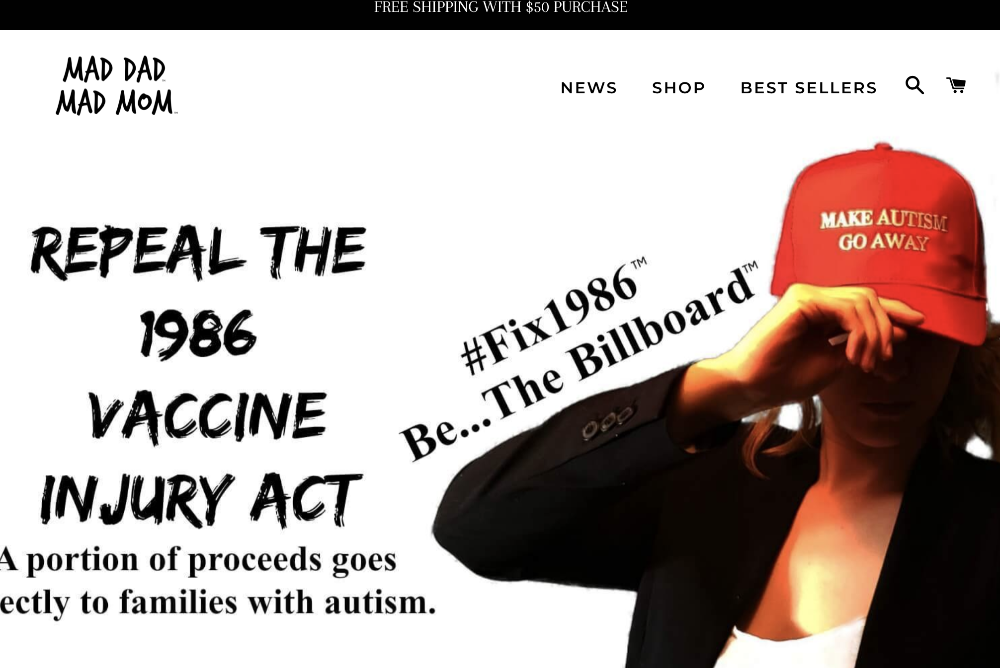

Twitter has now developed a vaccine misinformation tool
https://www.theverge.com/2019/5/14/18623494/twitter-vaccine-misinformation-anti-vax-search-tool-instagram-facebook

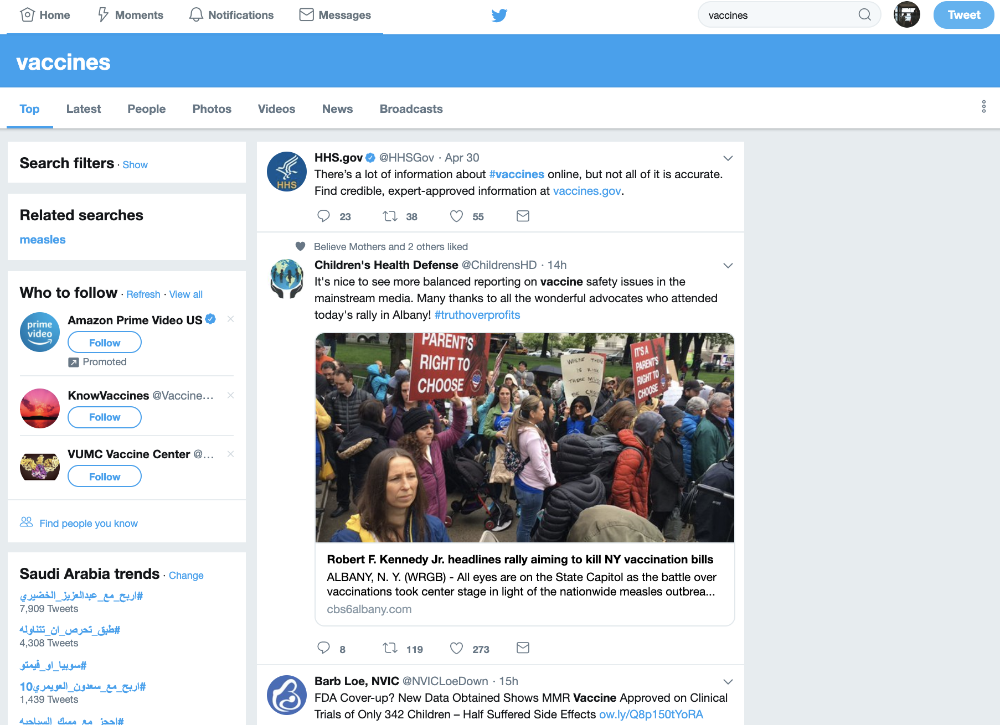

NVIC

"The head of the center, **Barbara Loe Fisher**, one time she made the case that vaccination had become a political tool to gain access to Americans’ DNA for nefarious purposes. 'So they’re using the vaccine-monitoring system as the skeletal system for a total takeover of health care,' Jones surmised, blaming Barack Obama. 'Then they’re using bioethicists to bring back eugenics and take over health care.'”

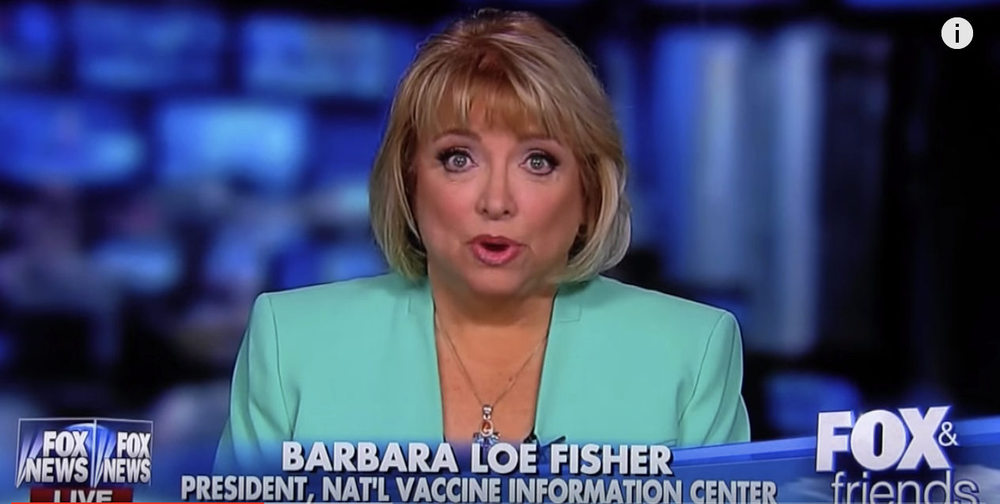

https://www.nvic.org/

Copyright 1982-2019 National Vaccine Information Center. All Rights Reserved. 
21525 Ridgetop Circle, Suite 100 Sterling, VA 20166


## Is it you joejoe? 

Reverse image searched on what I strongly suspect is a bot

https://twitter.com/joejoe80495073

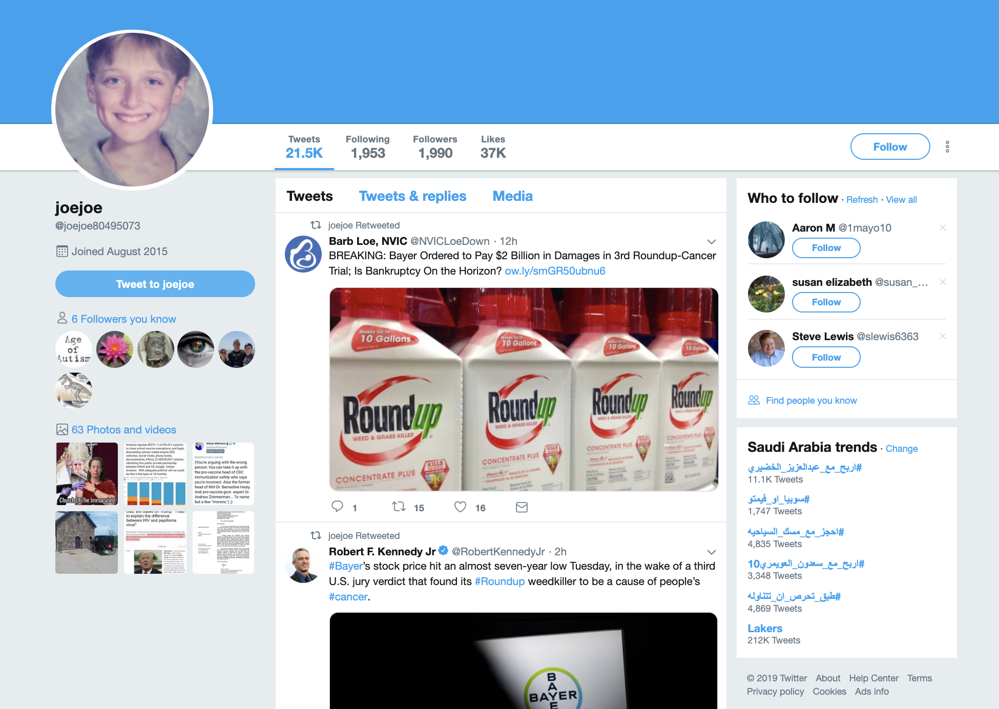

Retweets the usual suspects: Barb, Bobby. 

Joejoe has v. specific interests for a young boy. Very vaccine woke. 
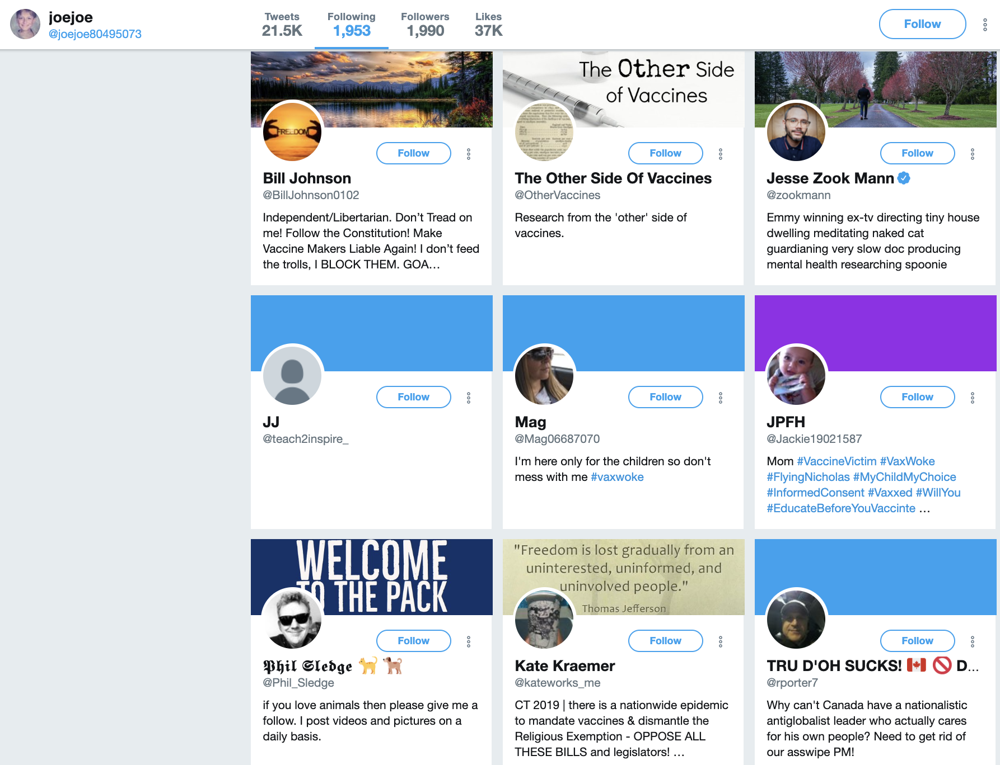

Didn't get an exact photo match but did get possible matches on Russian websites
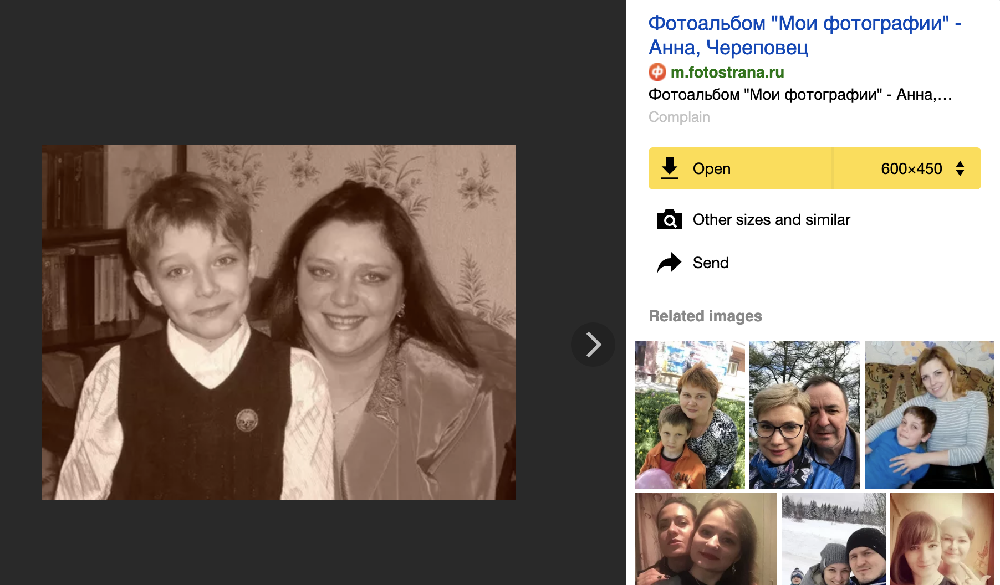

## Circling back: what's driving the disinformation?

This is the ultimate question. 

Things are a dangerous mess. 
https://www.nytimes.com/2019/05/14/nyregion/measles-vaccine-orthodox-jews.html?smtyp=cur&smid=tw-nytimes

"MONSEY, N.Y. — An ultra-Orthodox rabbi falsely described the measles outbreak among Jews as part of an elaborate plan concocted by Mayor Bill de Blasio of New York to deflect attention from “more serious” diseases brought by Central American migrants.

A pediatrician questioned whether Jews were being intentionally given “bad lots” of vaccines that ended up giving children a new strain of the virus. And **Andrew Wakefield, the British doctor whose study linking measles vaccines with autism was widely discredited and condemned, appeared via Skype to offer an almost apocalyptic vision of a world in which vaccines were giving rise to deadlier immunization-resistant diseases."

Things are going down in Texas: https://www.syracuse.com/us-news/2019/02/texas-lawmakers-push-bill-making-vaccine-exemptions-easier.html

Future potential for project; journalism as a public service. 

Researchers have found foreign agents amplifying anti-vaxx sentiments.
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6137759/ Weaponized Health Communication: Twitter Bots and Russian Trolls Amplify the Vaccine Debate

**More research is needed to determine how best to combat false content."**

Highlighting disinformation may be a way to do this. 